# Insurance Claim Fraud Detection

Project Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

Independent Variables

1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported


In [1]:
#import key libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
import warnings
warnings.filterwarnings ('ignore')

In [5]:
data=pd.read_csv('Automobile_insurance_fraud.csv')
pd.set_option("display.max_columns",None)

In [6]:
data.head(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


From this, I have noticed that there are '0 ' and '?' values that won't be picked up as NaN. I can also see that target is 'Y/N' which suggests that this is going to be a classification problem.

In [7]:
data.shape

(1000, 40)

In [8]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [10]:
data.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

Mix of data types which will need to be treated. I can also see that target is object, which confirms classification type problem 

In [12]:
 data.isnull()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
996,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
997,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
998,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


In [13]:
data.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

Showing no null values (Other than c39 which is entirely null values and therefore can be dropped), but I have seen lots of unexpected '0' or '?' which are equivalent to null values and will need to be treated

In [14]:
#checking the unique values
data.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

Policy number looks like a feature we can drop as it is just an index

In [15]:
#Looking for columns with '?' in them so that they can be treated
data[data.columns[(data == '?').any()]].nunique()


collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [16]:
#replace '?' with modal value
print (data["collision_type"].mode())

0    Rear Collision
Name: collision_type, dtype: object


In [18]:
#replace '?' with modal value
data['collision_type'] = data.collision_type.str.replace('?', 'Rear Collision')

In [19]:
#replace '?' with modal value
print (data["property_damage"].mode())
print (data["police_report_available"].mode())

0    ?
Name: property_damage, dtype: object
0     ?
1    NO
Name: police_report_available, dtype: object


'?' is the modal value so I will visualise the data to find the next common value

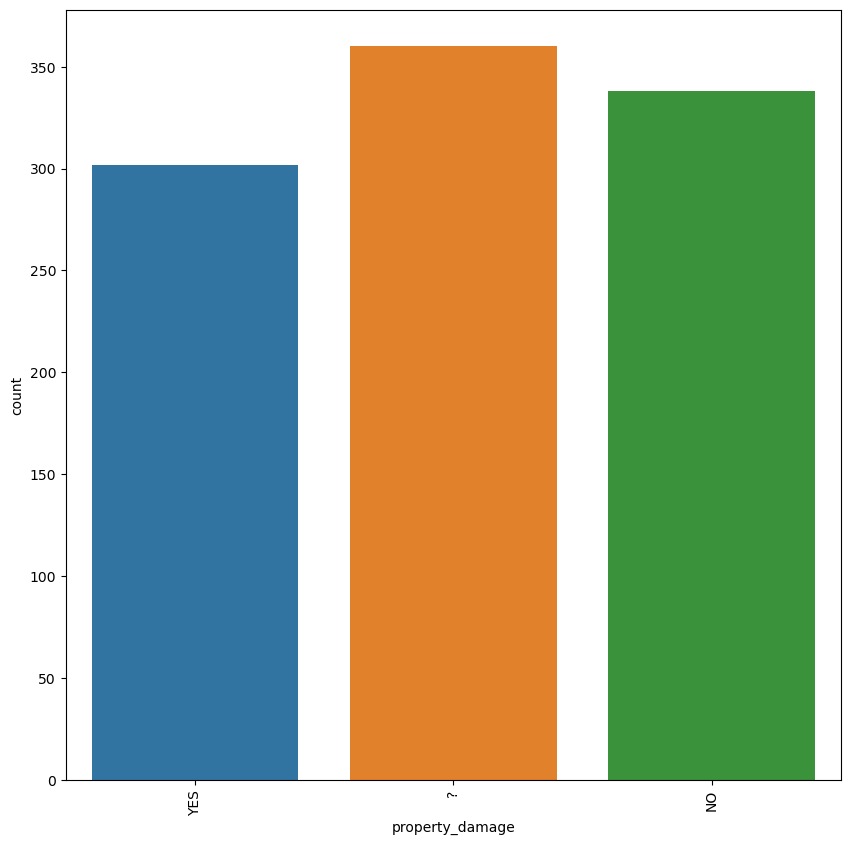

In [23]:
plt.figure(figsize=(10,10))
sns.countplot(data['property_damage'])
plt.xticks(rotation=90)
plt.show()

In [24]:
#replace '?' with modal value
data['property_damage'] = data.property_damage.str.replace('?', 'No')

In [25]:
#replace '?' with modal value
data['police_report_available'] = data.police_report_available.str.replace('?', 'No')

In [26]:
#Checking that all '?' values were treated
data[data.columns[(data == '?').any()]].nunique()


Series([], dtype: float64)

All '?' values removed

In [27]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [30]:
# Dropping irrelevant columns
data.drop(columns=["policy_number", "incident_location","_c39" ], axis=1, inplace=True)

In [31]:
data.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


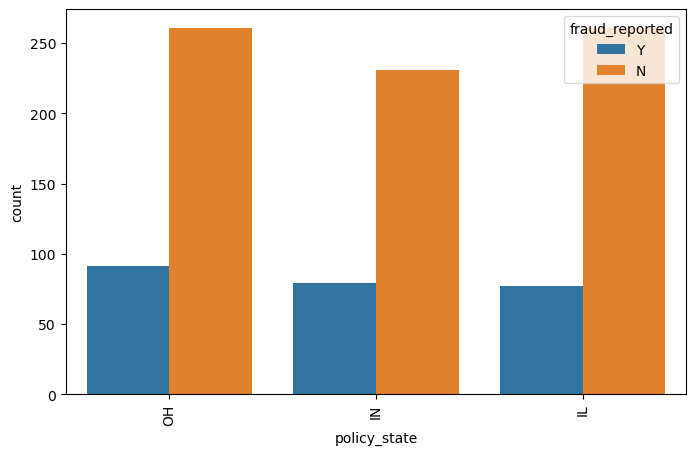

In [32]:
#explore features in relation with target 
print(data["policy_state"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["policy_state"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Reported fraud is fairly similar across all states

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


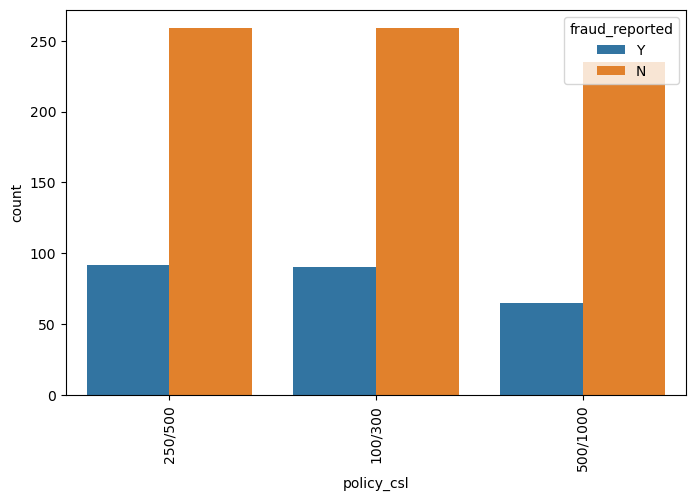

In [33]:
#explore features in relation with target 
print(data["policy_csl"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["policy_csl"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Like with our previous graph, we can see an almost distribution of reported fraud

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


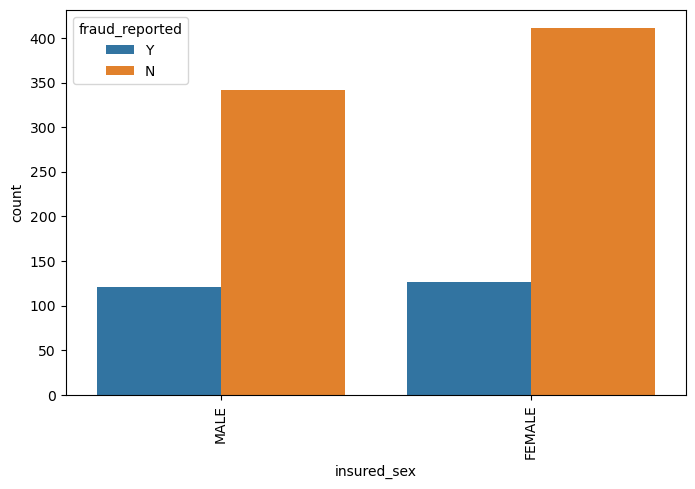

In [36]:
#explore features in relation with target 
print(data["insured_sex"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["insured_sex"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Females were marginally higher in reporting fraud compared with males

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


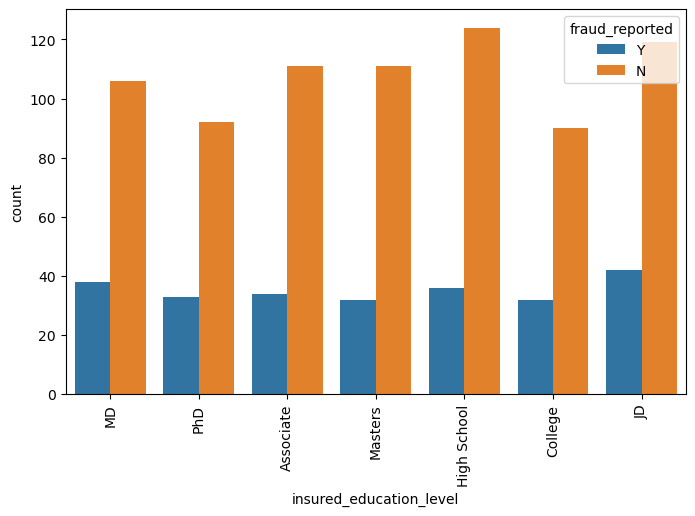

In [37]:
#explore features in relation with target 
print(data["insured_education_level"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["insured_education_level"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

JD has the highest count followed by High school. College has the smallest count.

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


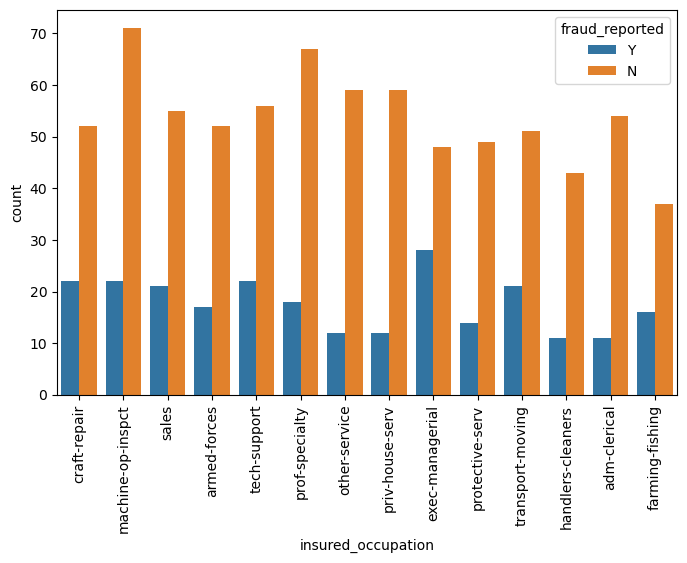

In [38]:
#explore features in relation with target 
print(data["insured_occupation"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["insured_occupation"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Exec-managerial has the highest amount of fraud reported. adm clerical and handlers-clearners are the lowest.

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


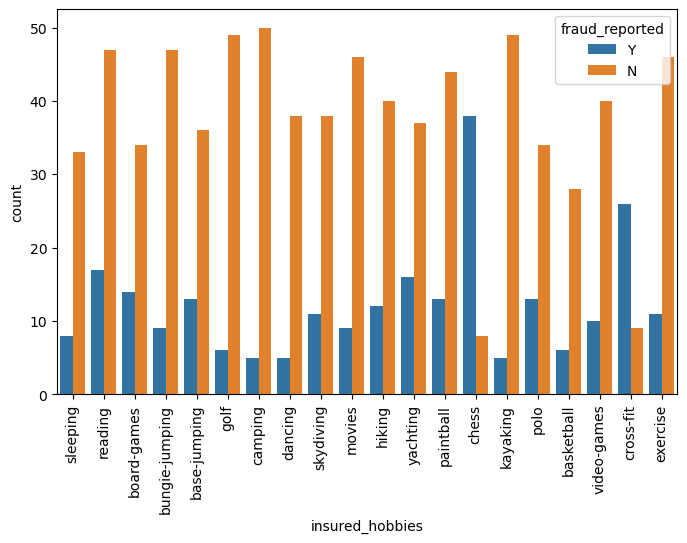

In [39]:
#explore features in relation with target 
print(data["insured_hobbies"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["insured_hobbies"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Chess players and cross-fit enthusiasts reported highest levels of fraud

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


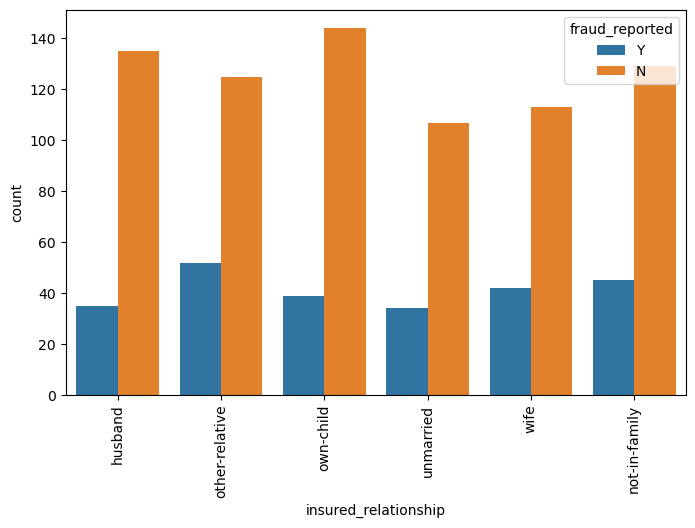

In [40]:
#explore features in relation with target 
print(data["insured_relationship"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["insured_relationship"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

'Other-relative' has the highest count of people who reported fraud. 'Not in family' was also high, and unmarried was the lowest

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


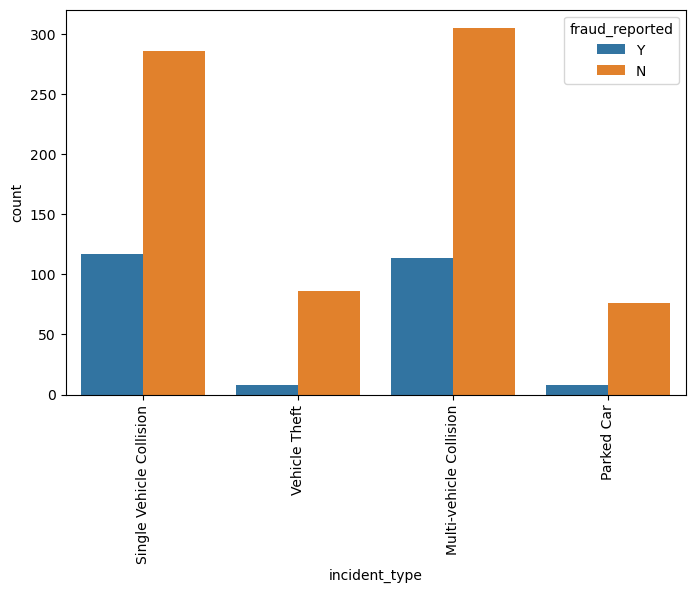

In [41]:
#explore features in relation with target 
print(data["incident_type"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["incident_type"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Single vehicle collision is slightly higher than multi-vehicle collision. Parked cars and vehicle theft are both very low

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


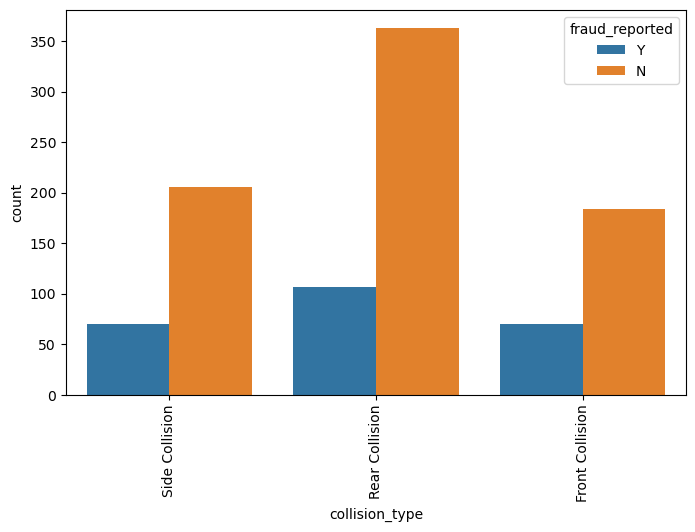

In [42]:
#explore features in relation with target 
print(data["collision_type"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["collision_type"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Rear collision has the highest number of reported fraud cases

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


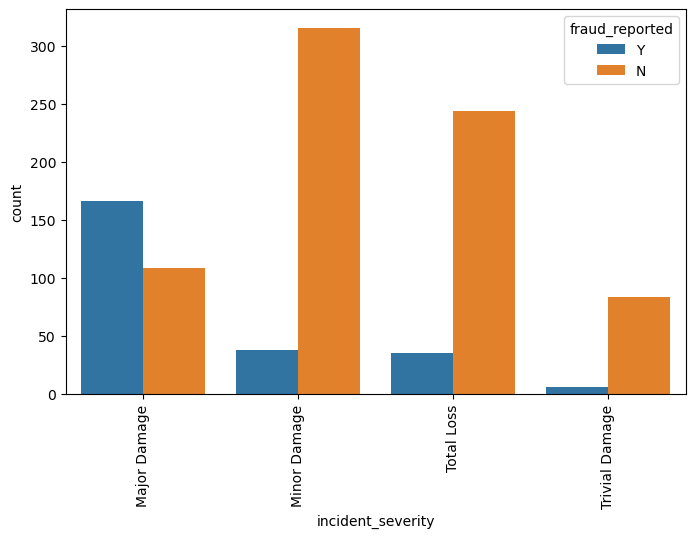

In [44]:
#explore features in relation with target 
print(data["incident_severity"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["incident_severity"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Minor damage has the most reported frauds. It is one of the few entries where more people claimed than didn't claim. Unsurprisingly, not many people claimed for trivial damage

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


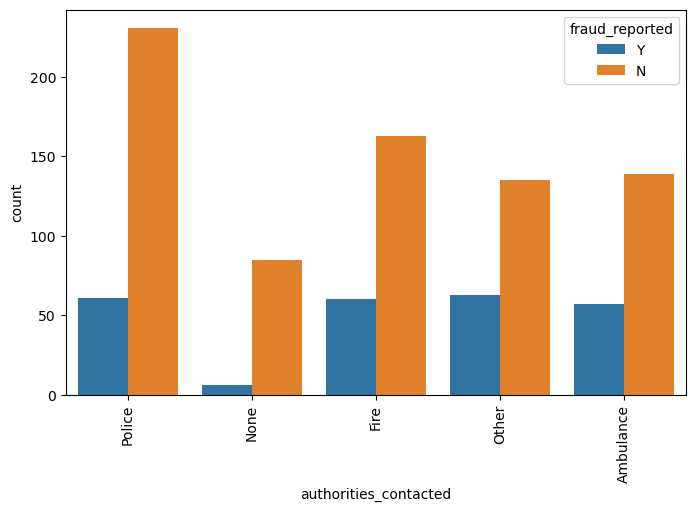

In [46]:
#explore features in relation with target 
print(data["authorities_contacted"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["authorities_contacted"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Police has the highest count, although each service has a similar count for people reporting fraud

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


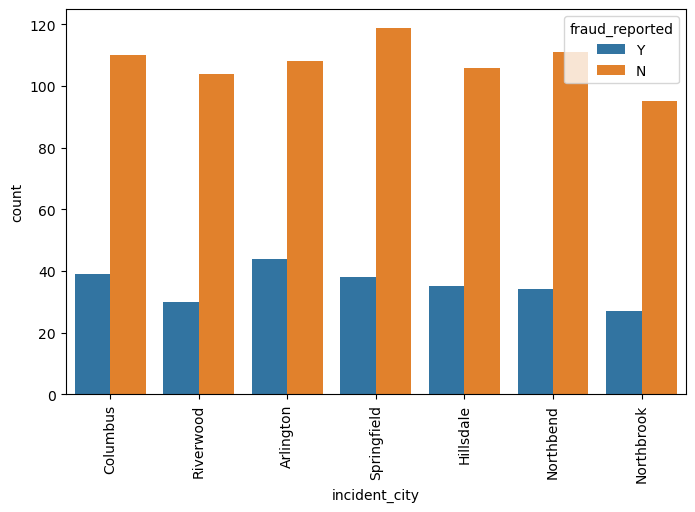

In [47]:
#explore features in relation with target 
print(data["incident_city"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["incident_city"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Fairly equal distribution across each city. Arlington is seeming to be the highest count for people reporting fraud

No     360
NO     338
YES    302
Name: property_damage, dtype: int64


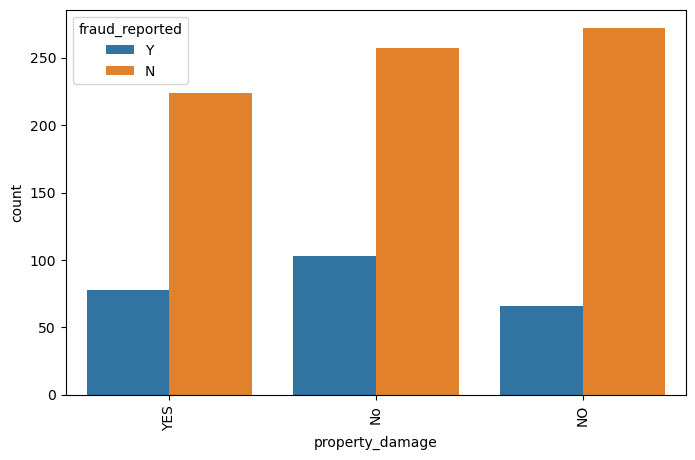

In [49]:
#explore features in relation with target 
print(data["property_damage"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["property_damage"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Here there has been an error, as there is three columns- two of which are showing the same value

In [50]:
data['property_damage'] = data.property_damage.str.replace('No', 'NO')

NO     698
YES    302
Name: property_damage, dtype: int64


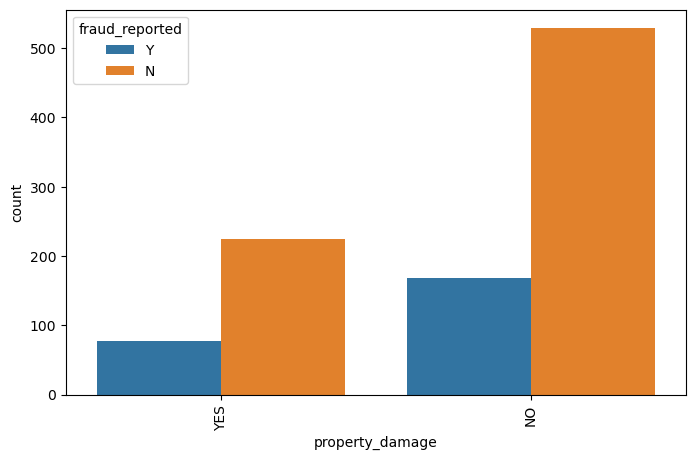

In [51]:
#explore features in relation with target 
print(data["property_damage"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["property_damage"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

People without property damage claimed fraud more so than those without property damage

No     343
NO     343
YES    314
Name: police_report_available, dtype: int64


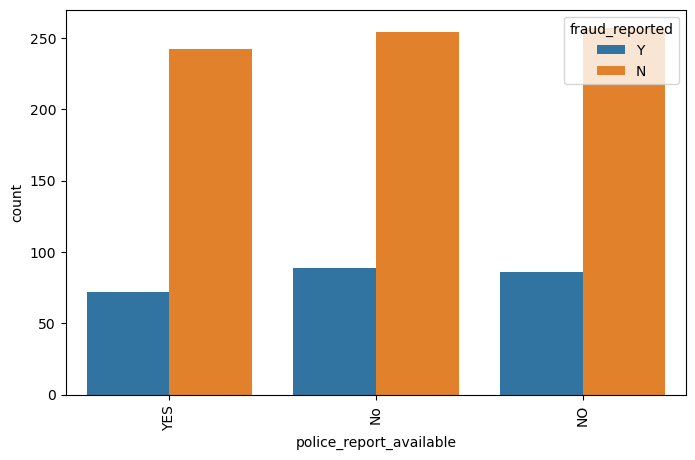

In [52]:
#explore features in relation with target 
print(data["police_report_available"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["police_report_available"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

Like with property damage, there has been an error, as there is three columns- two of which are showing the same value

In [53]:
#Replace 'No' for 'NO'
data['police_report_available'] = data.police_report_available.str.replace('No', 'NO')

NO     686
YES    314
Name: police_report_available, dtype: int64


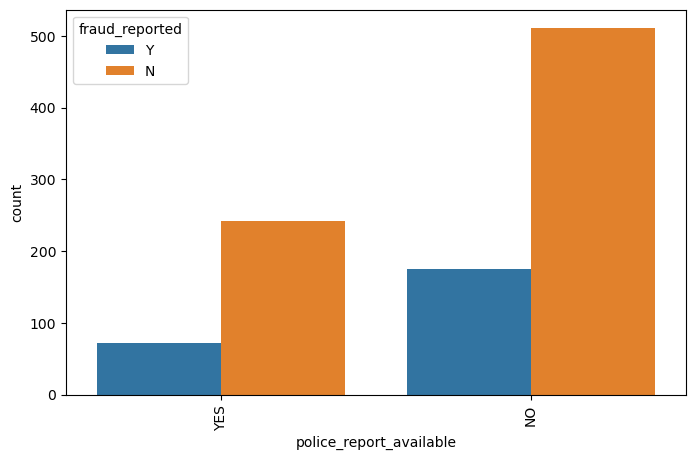

In [54]:
#explore features in relation with target 
print(data["police_report_available"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["police_report_available"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

People without access to a police report claimed fraud more so than those with police reports

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


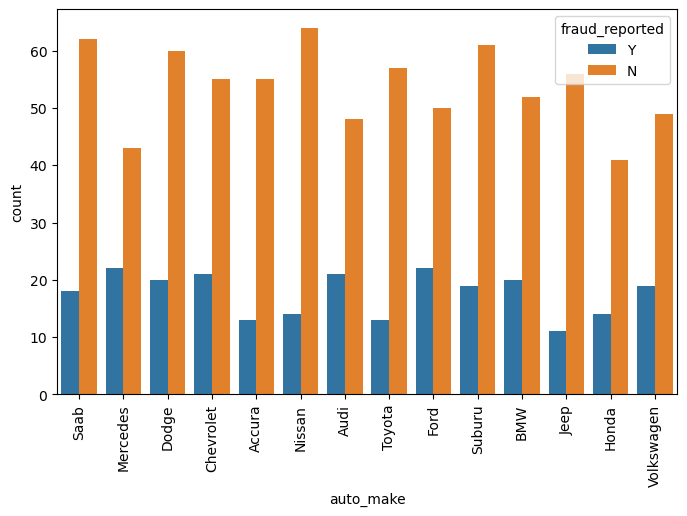

In [55]:
#explore features in relation with target 
print(data["auto_make"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["auto_make"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

A fairly equal distribution between car makes. The Mercedes seems to have the highest count for fraud claims

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


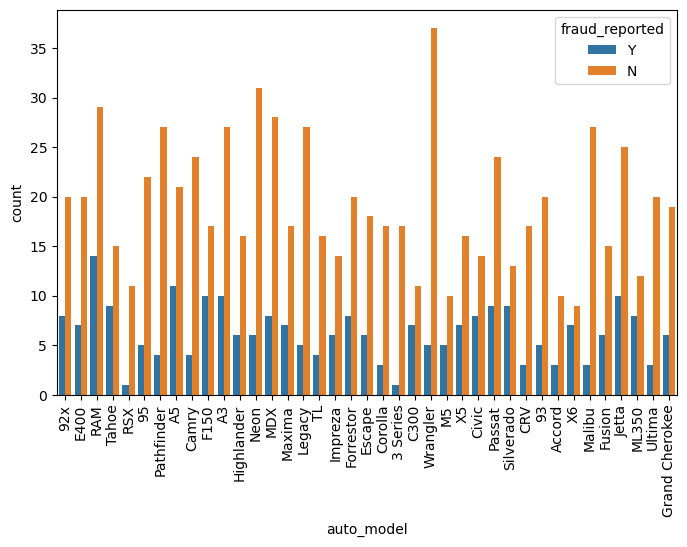

In [56]:
#explore features in relation with target 
print(data["auto_model"].value_counts())
plt.figure(figsize=(8,5))
sns.countplot(data["auto_model"],hue=data["fraud_reported"])
plt.xticks(rotation=90)
plt.show()

The RAM has the highest count for people claiming fraud with the 3 series and RSX with the lowest

In [57]:
data.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

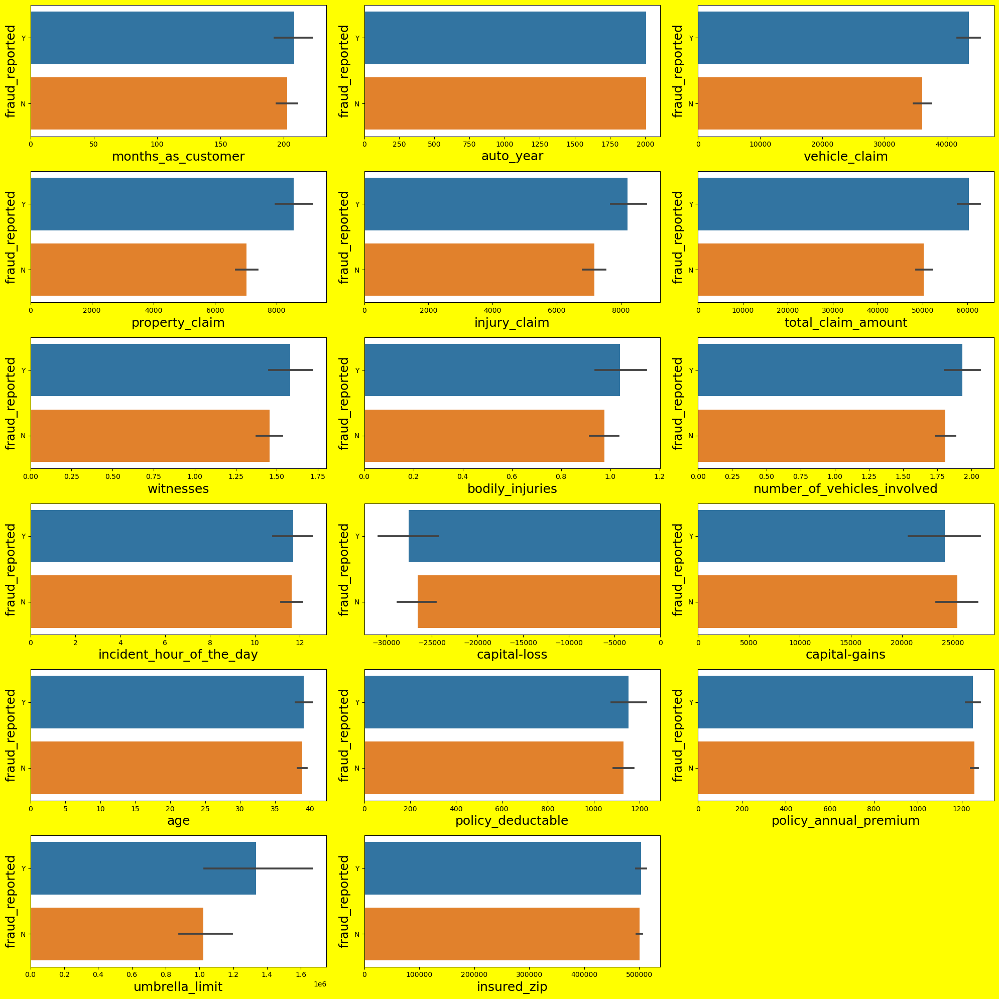

In [79]:
x = data[['months_as_customer', 'auto_year', 'vehicle_claim', 'property_claim', 
           'injury_claim', 'total_claim_amount', 'witnesses', 'bodily_injuries', 
           'number_of_vehicles_involved', 'incident_hour_of_the_day', 
           'capital-loss', 'capital-gains', 'age', 'policy_deductable', 
           'policy_annual_premium', 'umbrella_limit', 'insured_zip']]
y= (data['fraud_reported'])
plt.figure(figsize=(20,20), facecolor='yellow')
plotnumber=1
for column in x:
    if plotnumber <=18:
        ax=plt.subplot(6,3,plotnumber)
        sns.barplot (x[column], y)
        plt.xlabel(column, fontsize=18)
        plt.ylabel ('fraud_reported', fontsize=18)
        plotnumber +=1
        plt.tight_layout()
        

Observations from EDA on numerical data: 
    - Generally, the higher the claim, the more likely it is that people were claiming fraud. This is true of injury claims as well as vehicle and property claims.
    - The amount of witnesses also increases the liklihood of people claiming fraud. 
    - A higher umberlla limit also indicates greater chances of fraud.

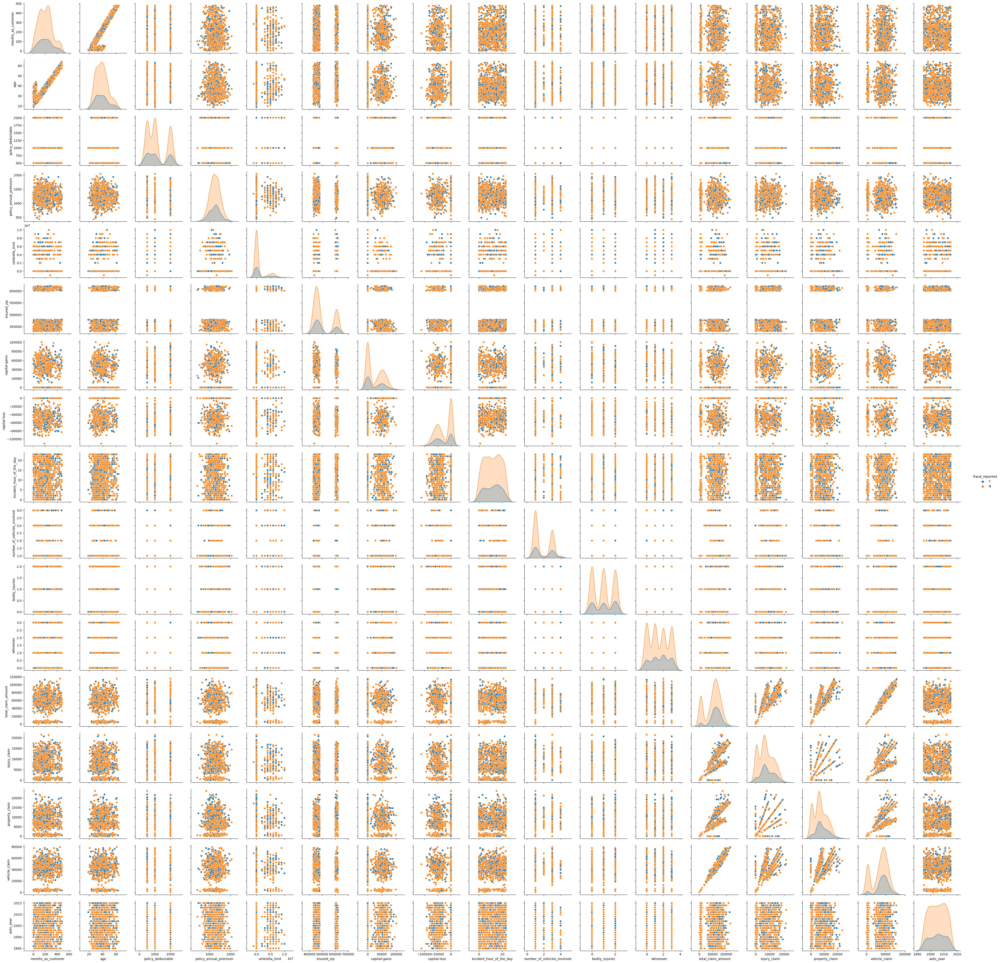

In [81]:
# Using pairplots to explore dataset among features.
sns.pairplot(data,hue="fraud_reported")

From this multivariate analysis, I can see some linear relationships between age and months_as_customer where the older the customer the less fraudulant claims there are, vehicle claim and total claim amount, vehicle claim and property claim. I also noticed that there were more fraudulant claims under vehicle claims where polict deductable was lower.As well as this, when there were more vehicles involved, the amount of fraudulant claims increased.

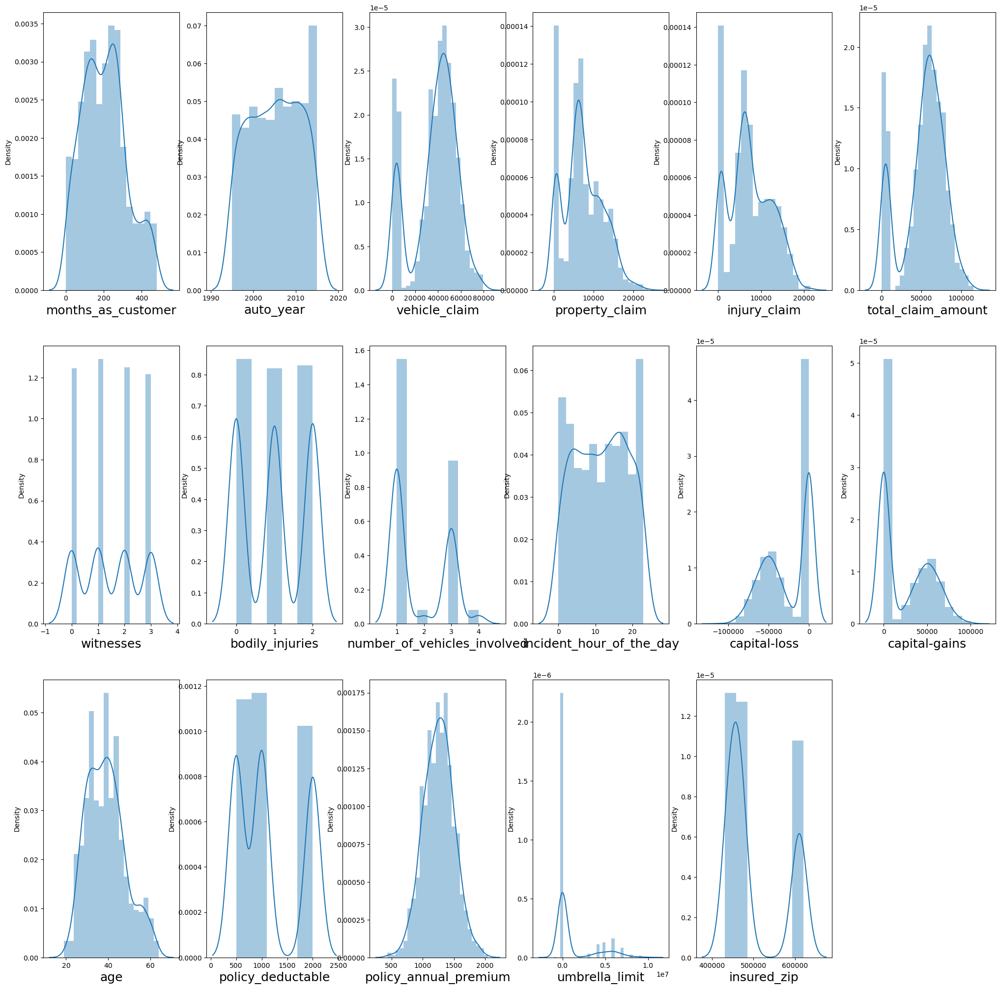

In [87]:
#Check the distribution in the numerical columns 
columns = ['months_as_customer', 'auto_year', 'vehicle_claim', 'property_claim', 
           'injury_claim', 'total_claim_amount', 'witnesses', 'bodily_injuries', 
           'number_of_vehicles_involved', 'incident_hour_of_the_day', 
           'capital-loss', 'capital-gains', 'age', 'policy_deductable', 
           'policy_annual_premium', 'umbrella_limit', 'insured_zip']

plotnumber = 1
plt.figure(figsize=(25,25))
for column in columns:
    if plotnumber <= 18:
        ax = plt.subplot(3, 6, plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column, fontsize=18)
        plotnumber += 1

plt.show()

High counts of '0' amount claimed as caused some left skew in vehicle claim, property claim, injury claim, total claim amount, capital gains and umbrella limit. Generally though, the distribution is fairly normal

months_as_customer                AxesSubplot(0.125,0.786098;0.227941x0.0939024)
age                            AxesSubplot(0.398529,0.786098;0.227941x0.0939024)
policy_deductable              AxesSubplot(0.672059,0.786098;0.227941x0.0939024)
policy_annual_premium             AxesSubplot(0.125,0.673415;0.227941x0.0939024)
umbrella_limit                 AxesSubplot(0.398529,0.673415;0.227941x0.0939024)
insured_zip                    AxesSubplot(0.672059,0.673415;0.227941x0.0939024)
capital-gains                     AxesSubplot(0.125,0.560732;0.227941x0.0939024)
capital-loss                   AxesSubplot(0.398529,0.560732;0.227941x0.0939024)
incident_hour_of_the_day       AxesSubplot(0.672059,0.560732;0.227941x0.0939024)
number_of_vehicles_involved       AxesSubplot(0.125,0.448049;0.227941x0.0939024)
bodily_injuries                AxesSubplot(0.398529,0.448049;0.227941x0.0939024)
witnesses                      AxesSubplot(0.672059,0.448049;0.227941x0.0939024)
total_claim_amount          

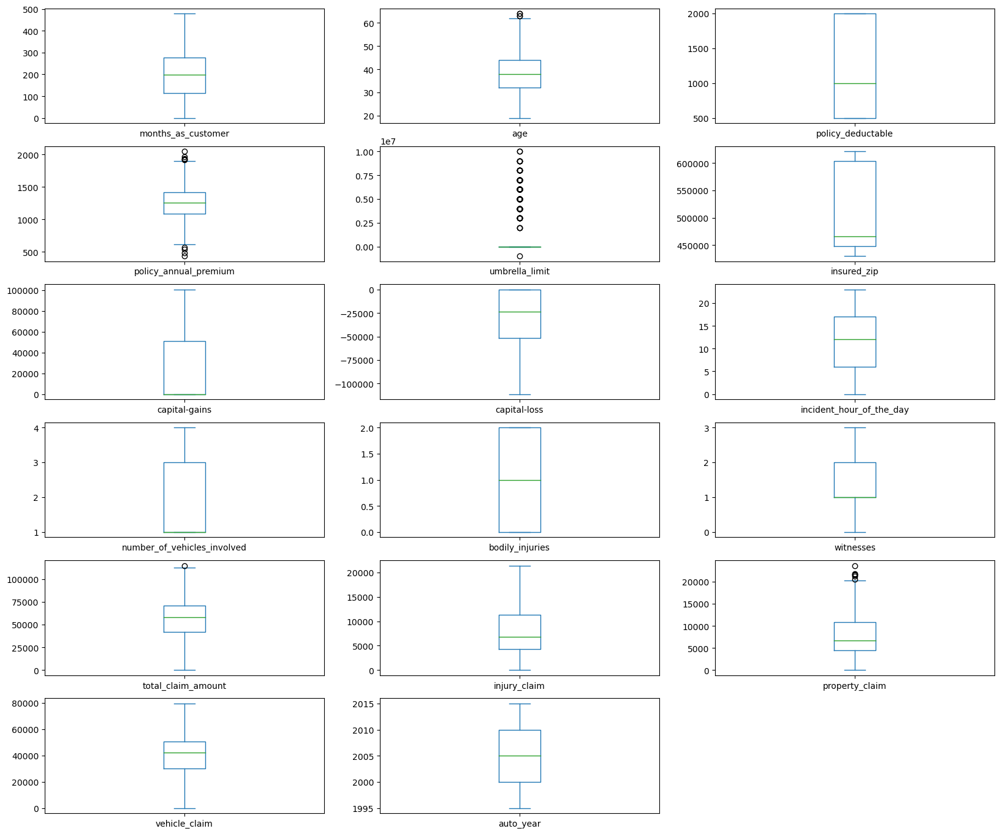

In [88]:
#Exploring outliers
data.plot(kind='box',subplots=True,layout=(7,3),figsize=(20,20))

Outliers present in the dataset within property_claim, age, policy_annual_premium and total_claim_amount

In [89]:
# Umbrella limit is highly skewed and has lots of outliers. I will drop this feature
data.drop(columns=["umbrella_limit"], axis=1, inplace=True)

In [92]:
data.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries          

In [112]:
#Converting categorical features to numerical using label encoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
columns_to_encode = ['auto_make','auto_model','police_report_available','property_damage','incident_city','incident_state', 'authorities_contacted', 'incident_severity', 'collision_type','incident_type', 'insured_relationship', 'insured_hobbies','insured_sex', 'insured_education_level', 'insured_occupation']

for i in columns_to_encode:
    data[i] = le.fit_transform(data[i])

KeyError: 'auto_model'

In [99]:
le = LabelEncoder()
columns_to_encode = ['fraud_reported']
for i in columns_to_encode:
    data[i] = le.fit_transform(data[i])

In [100]:
data.head(5)

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,466132,1,4,2,17,0,53300,0,25-01-2015,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1
1,228,42,27-06-2006,IN,250/500,2000,1197.22,468176,1,4,6,15,2,0,0,21-01-2015,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,2007,1
2,134,29,06-09-2000,OH,100/300,2000,1413.14,430632,0,6,11,2,3,35100,0,22-02-2015,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0
3,256,41,25-05-1990,IL,250/500,2000,1415.74,608117,0,6,1,2,4,48900,-62400,10-01-2015,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,2014,1
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,610706,1,0,11,2,4,66000,-46000,17-02-2015,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,2009,0


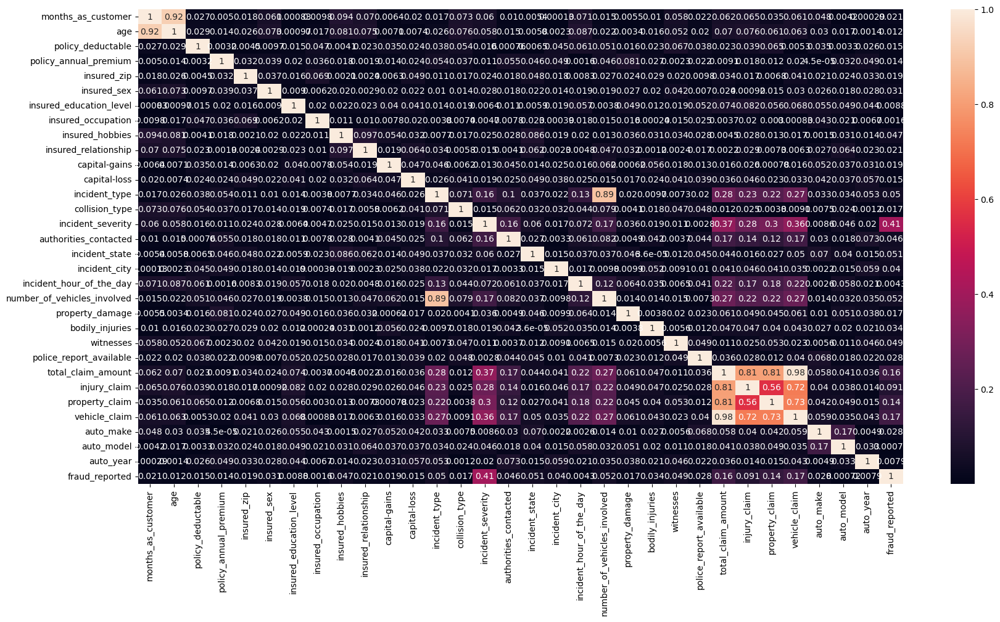

In [101]:
#Explore correlation
df_corr= data.corr().abs()
plt.figure (figsize=(20,10))
sns.heatmap(df_corr, annot=True,)
plt.show()

It is evident that number of vehicles involved is highly correlated with incident type and total claim amount is highly correlated with injury, property and vehicle claim- This could lead to a multicolinearity issue. I will check this with VIF later.

In [102]:
data.corr()['fraud_reported'].sort_values()

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_city                 -0.040403
police_report_available       -0.027768
auto_make                     -0.027519
capital-gains                 -0.019173
collision_type                -0.017315
capital-loss                  -0.014863
policy_annual_premium         -0.014480
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
property_damage                0.017202
insured_zip                    0.019368
months_as_customer             0.020544
insured_relationship           0.021043
insured_sex                    0.030873
bodily_injuries                0.033877


Lots of negatively correlated values to the target. The highest negatively correlated is incident severity and the highest positive correlation is vehicle claim

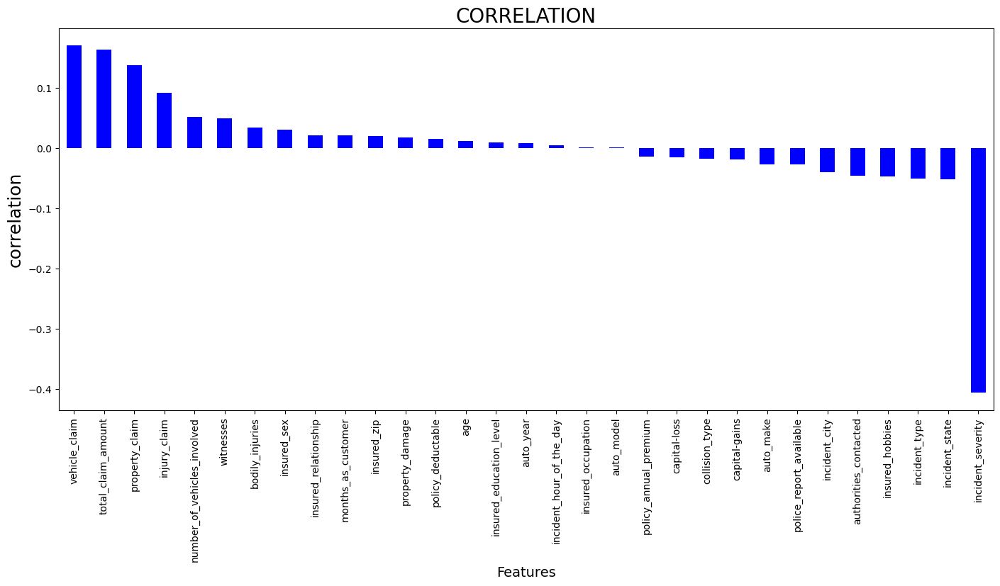

In [103]:
# Visualise positive or negative correlation 
plt.figure(figsize=(17,7))
data.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='b')
plt.xlabel('Features',fontsize=14)
plt.ylabel('correlation',fontsize=18)
plt.title('CORRELATION',fontsize=20)
plt.show()

In [104]:
# Dropping columns with no correlation to target
data.drop(columns=["auto_model", "insured_occupation"], axis=1, inplace=True)

In [107]:
data.drop(columns=["incident_date"], axis=1, inplace=True)

In [113]:
data.drop(columns=["policy_bind_date"], axis=1, inplace=True)

In [108]:
#Using Zscore to remove outliers
data.shape

(1000, 33)

In [111]:
data.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
insured_zip                      int64
insured_sex                      int32
insured_education_level          int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                        int64
police_report_available  

In [114]:
le = LabelEncoder()
columns_to_encode = ['policy_state','policy_csl']

for i in columns_to_encode:
    data[i] = le.fit_transform(data[i])

In [115]:
from scipy.stats import zscore
z=np.abs(zscore(data))
threshold=3
np.where(z>3)

(array([229, 248, 500, 763, 807], dtype=int64),
 array([ 5,  5, 27,  5, 12], dtype=int64))

In [116]:
#Removing outliers
outliers = np.where(z > threshold)
outlier_rows = outliers[0]
data_new = data.drop(index=data.index[outlier_rows])

In [117]:
data_new.shape

(995, 32)

In [118]:
Dataloss=((1000-995)/1000)*100
Dataloss

0.5

0.5% data loss

In [119]:
#removingskewness
data_new.skew()

months_as_customer             0.358958
age                            0.473974
policy_state                  -0.028196
policy_csl                     0.093128
policy_deductable              0.475849
policy_annual_premium          0.033107
insured_zip                    0.824182
insured_sex                    0.143294
insured_education_level        0.001403
insured_hobbies               -0.061489
insured_relationship           0.078491
capital-gains                  0.479472
capital-loss                  -0.379708
incident_type                  0.101056
collision_type                -0.033901
incident_severity              0.274925
authorities_contacted         -0.122469
incident_state                -0.146787
incident_city                  0.047785
incident_hour_of_the_day      -0.040232
number_of_vehicles_involved    0.503045
property_damage                0.855977
bodily_injuries                0.012979
witnesses                      0.027371
police_report_available        0.804900


In [121]:
data_new.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'insured_zip',
       'insured_sex', 'insured_education_level', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_year',
       'fraud_reported'],
      dtype='object')

In [120]:
#Using Yeojohnson to deal with skewness in non-categorical columns
from sklearn.preprocessing import PowerTransformer

columns_to_transform=['vehicle_claim','total_claim_amount']          
PT = PowerTransformer(method='yeo-johnson')

data_new[columns_to_transform] = PT.fit_transform(data_new[columns_to_transform])


In [122]:
#Check the distribution after power transform 
data_new.skew()

months_as_customer             0.358958
age                            0.473974
policy_state                  -0.028196
policy_csl                     0.093128
policy_deductable              0.475849
policy_annual_premium          0.033107
insured_zip                    0.824182
insured_sex                    0.143294
insured_education_level        0.001403
insured_hobbies               -0.061489
insured_relationship           0.078491
capital-gains                  0.479472
capital-loss                  -0.379708
incident_type                  0.101056
collision_type                -0.033901
incident_severity              0.274925
authorities_contacted         -0.122469
incident_state                -0.146787
incident_city                  0.047785
incident_hour_of_the_day      -0.040232
number_of_vehicles_involved    0.503045
property_damage                0.855977
bodily_injuries                0.012979
witnesses                      0.027371
police_report_available        0.804900


skewness reduced

In [123]:
data.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1.01400,0.951000,1136.000000,1256.406150,501214.488000,0.463000,2.966000,9.731000,2.416000,25126.100000,-26793.700000,1.172000,1.022000,1.184000,2.167000,3.242000,2.966000,11.644000,1.83900,0.302000,0.992000,1.487000,0.314000,52761.94000,7433.420000,7399.570000,37928.950000,6.546000,2005.103000,0.247000
std,115.113174,9.140287,0.83096,0.804516,611.864673,244.167395,71701.610941,0.498879,1.948497,5.674049,1.681003,27872.187708,28104.096686,1.081474,0.728043,0.939695,1.532142,2.155942,2.044266,6.951373,1.01888,0.459355,0.820127,1.111335,0.464349,26401.53319,4880.951853,4824.726179,18886.252893,4.034869,6.015861,0.431483
min,0.000000,19.000000,0.00000,0.000000,500.000000,433.330000,430104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-111100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,0.000000,1995.000000,0.000000
25%,115.750000,32.000000,0.00000,0.000000,500.000000,1089.607500,448404.500000,0.000000,1.000000,5.000000,1.000000,0.000000,-51500.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,6.000000,1.00000,0.000000,0.000000,1.000000,0.000000,41812.50000,4295.000000,4445.000000,30292.500000,3.000000,2000.000000,0.000000
50%,199.500000,38.000000,1.00000,1.000000,1000.000000,1257.200000,466445.500000,0.000000,3.000000,10.000000,2.000000,0.000000,-23250.000000,1.000000,1.000000,1.000000,2.000000,4.000000,3.000000,12.000000,1.00000,0.000000,1.000000,1.000000,0.000000,58055.00000,6775.000000,6750.000000,42100.000000,7.000000,2005.000000,0.000000
75%,276.250000,44.000000,2.00000,2.000000,2000.000000,1415.695000,603251.000000,1.000000,5.000000,15.000000,4.000000,51025.000000,0.000000,2.000000,2.000000,2.000000,4.000000,5.000000,5.000000,17.000000,3.00000,1.000000,2.000000,2.000000,1.000000,70592.50000,11305.000000,10885.000000,50822.500000,10.000000,2010.000000,0.000000
max,479.000000,64.000000,2.00000,2.000000,2000.000000,2047.590000,620962.000000,1.000000,6.000000,19.000000,5.000000,100500.000000,0.000000,3.000000,2.000000,3.000000,4.000000,6.000000,6.000000,23.000000,4.00000,1.000000,2.000000,3.000000,1.000000,114920.00000,21450.000000,23670.000000,79560.000000,13.000000,2015.000000,1.000000


In [124]:
#Separate into dependent and independent variables
x=data_new.drop (columns=['fraud_reported'], axis=1)
y=data_new['fraud_reported']

In [125]:
#Scaling data
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_scaled=scaler.fit_transform(data_new)
x_scaled

array([[ 1.07398371,  0.98659211,  1.18551664, ...,  0.85625033,
        -0.18419417,  1.7449113 ],
       [ 0.20458414,  0.33018345, -0.01814566, ...,  0.35976485,
         0.31518785,  1.7449113 ],
       [-0.61265146, -1.09203531,  1.18551664, ..., -0.6332061 ,
         0.31518785, -0.57309503],
       ...,
       [-0.64742744, -0.5450281 ,  1.18551664, ...,  1.10449307,
        -1.51587958, -0.57309503],
       [ 2.20420315,  2.51821232, -1.22180797, ..., -1.37793431,
        -1.18295823, -0.57309503],
       [ 2.18681516,  2.29940944,  1.18551664, ...,  0.35976485,
         0.31518785, -0.57309503]])

In [126]:
#Based on correlation heatmap, there could be a possibility of multicolinearity. I will check this with VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [127]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [128]:
vif_cal()

      VIF FACTOR                     FEATURES
0      28.403048           months_as_customer
1     131.125957                          age
2       2.565905                 policy_state
3       2.442058                   policy_csl
4       4.613155            policy_deductable
5      29.350899        policy_annual_premium
6      51.087870                  insured_zip
7       1.921714                  insured_sex
8       3.425050      insured_education_level
9       4.114725              insured_hobbies
10      3.162851         insured_relationship
11      1.864066                capital-gains
12      1.978195                 capital-loss
13     11.061358                incident_type
14      3.090100               collision_type
15      3.163701            incident_severity
16      3.302670        authorities_contacted
17      3.392220               incident_state
18      3.170511                incident_city
19      4.180823     incident_hour_of_the_day
20     21.721280  number_of_vehicl

In [129]:
#Dropping highest multicorelated features 
x.drop('total_claim_amount',axis=1,inplace=True)

In [132]:
#Reducing multicorelated features 
x.drop('auto_year',axis=1,inplace=True)

In [134]:
#Reducing multicorelated features 
x.drop('insured_zip',axis=1,inplace=True)

In [135]:
vif_cal()

    VIF FACTOR                     FEATURES
0    23.179694           months_as_customer
1    95.193613                          age
2     2.520302                 policy_state
3     2.427763                   policy_csl
4     4.548517            policy_deductable
5    24.445153        policy_annual_premium
6     1.909732                  insured_sex
7     3.378508      insured_education_level
8     4.053265              insured_hobbies
9     3.116501         insured_relationship
10    1.859477                capital-gains
11    1.967710                 capital-loss
12    8.452564                incident_type
13    3.052524               collision_type
14    3.010317            incident_severity
15    3.185788        authorities_contacted
16    3.359790               incident_state
17    3.140794                incident_city
18    4.124602     incident_hour_of_the_day
19   16.198261  number_of_vehicles_involved
20    1.470912              property_damage
21    2.498527              bodi

multicolinearity has been reduced but not eradicated

In [136]:
#Split data into Xtrain/test and ytrain/test
x_train, x_test, y_train, y_test= train_test_split (x,y, test_size= 0.2, random_state= 3)

In [137]:
#importing ML libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report


In [138]:
from sklearn.model_selection import cross_val_score
lr = LogisticRegression()
cv = cross_val_score(lr,x_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.75       0.74213836 0.75471698 0.74842767 0.74842767]
0.7487421383647799


Scores aren't too bad

In [139]:
rf = RandomForestClassifier(random_state = 1)
cv = cross_val_score(rf,x_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.75625    0.7672956  0.7672956  0.77358491 0.81132075]
0.7751493710691825


Higher than logistic regression

In [140]:
from sklearn.tree import DecisionTreeClassifier
dt= DecisionTreeClassifier(random_state =1)
cv = cross_val_score(dt,x_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.75       0.7672956  0.75471698 0.77358491 0.78616352]
0.7663522012578616


Not as good as Random Forest

In [141]:
KNN= KNeighborsClassifier()
cv = cross_val_score(KNN,x_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.68125    0.70440252 0.71698113 0.75471698 0.67295597]
0.7060613207547171


Poor scores

In [142]:
from sklearn.ensemble import GradientBoostingClassifier
gb= GradientBoostingClassifier(random_state =1)
cv = cross_val_score(gb,x_train,y_train,cv=5)
print(cv)
print(cv.mean())

[0.78125    0.81132075 0.81132075 0.83018868 0.8490566 ]
0.816627358490566


Gradient Boost has the highest scores so far

In [143]:
gb.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 1,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#Finding best params
from sklearn.metrics import make_scorer

gb = GradientBoostingClassifier()

param_grid_gb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.1, 0.2],
    'max_depth': [None, 5, 10],
    'subsample': [0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None],
    'random_state': [42],
    'criterion': ['friedman_mse', 'mse', 'mae'],
}

grid_search_gb = GridSearchCV(gb, param_grid_gb, scoring=make_scorer(accuracy_score), cv=3)
grid_search_gb.fit(x_train, y_train)
best_params_gb = grid_search_gb.best_params_
best_score_gb = grid_search_gb.best_score_
best_model_gb = grid_search_gb.best_estimator_
y_pred_gb = best_model_gb.predict(x_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)

print(f"Best Model - Hyperparameters: {best_params_gb}, Accuracy: {accuracy_gb}")


In [147]:
gb=GradientBoostingClassifier(n_estimators= 100, max_depth= 10, min_samples_split=5, min_samples_leaf= 2, learning_rate= 0.1, subsample=0.9, random_state=42)
gb.fit(x_train, y_train)

GradientBoostingClassifier(max_depth=10, min_samples_leaf=2,
                           min_samples_split=5, random_state=42, subsample=0.9)

In [148]:
y_pred = gb.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"Gradient Boosting Classifier Model - Accuracy: {accuracy}")

Gradient Boosting Classifier Model - Accuracy: 0.8140703517587939


In [149]:
from sklearn.metrics import classification_report
print ( classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.88      0.88       150
           1       0.62      0.61      0.62        49

    accuracy                           0.81       199
   macro avg       0.75      0.75      0.75       199
weighted avg       0.81      0.81      0.81       199



In [150]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

x= data.drop (columns= ['fraud_reported'])
y= data ['fraud_reported']
gb = GradientBoostingClassifier()

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42) 
accuracy_scores = []
for train_index, test_index in kf.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    gb.fit(x_train, y_train)

    y_pred = gb.predict(x_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_scores.append(accuracy)

mean_accuracy = sum(accuracy_scores) / n_splits
print(f"Mean Accuracy: {mean_accuracy:.2f}")


Mean Accuracy: 0.82


Happy with this for accuracy

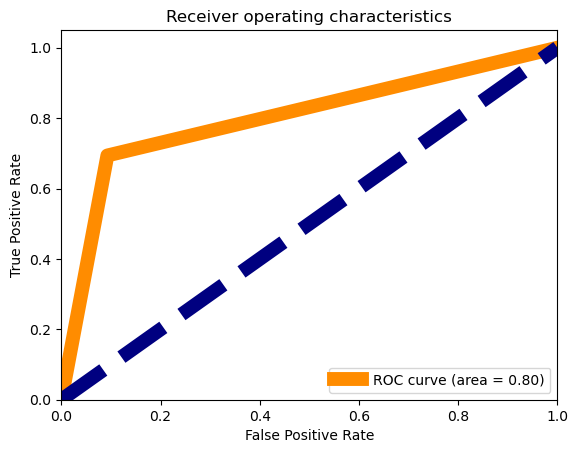

In [152]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,threshold=roc_curve(y_pred,y_test)
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

80% under curve is good

In [154]:
compare={"Actual": y_test, "Predict": y_pred}
pd.DataFrame(compare)

,Actual,Predict
1,1,0
4,0,0
13,0,0
14,1,0
20,0,0
...,...,...
976,0,1
980,0,0
982,1,1
992,0,1


In [155]:
import pickle
filename= 'Insurance.pkl'
pickle.dump(gb, open(filename,'wb'))
loaded_model= pickle.load(open('Insurance.pkl', 'rb'))